<a href="https://colab.research.google.com/github/clodoaldocodes/CAMERA-APP/blob/main/queimadas/inmet_queimadas_correlation_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dados utilizados

Planilha das distâncias: [Planilha](https://docs.google.com/spreadsheets/d/1X50Od8sjwehLjL2d2fNlaAo76S-ZzBRF/edit?gid=266767562#gid=266767562).

Documentação WeatherAPI: [Documentação](https://docs.google.com/document/d/1NfatlzmRRNakWEmKoBUCpAkgCDYJwfCU8xTefI6dJww/edit).

Planilha com a descrição das APIs: [Descrição das APIs](https://docs.google.com/spreadsheets/d/1dxD9SUPmx9xdOnEm0sJIddTvYDcksiCD6U_T-cQx-eo/edit?gid=0#gid=0).

Dados dos desligamentos de Furnas causados por queimadas: [Exemplo de dados utilizdos] (https://docs.google.com/spreadsheets/d/16uevfywYz3ZFnxC67k0SfYHtArbrbQkDmBIp_ZvVNvE/edit?gid=1613804417#gid=1613804417).

# Análise da correlação dos dados (INMET)

In [44]:
import pandas as pd
import os
import glob
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [4]:
base_path = '/content/drive/Shareddrives/Inspectral - Queimadas/Download_estações_INMET/25_estações/'

# # Lê o CSV com o cabeçalho na linha 9 e dados a partir da linha 10
# df = pd.read_csv('/content/drive/Shareddrives/Inspectral - Queimadas/Download_estações_INMET/25_estações/2015/INMET_CO_DF_A046_GAMA (PONTE ALTA)_01-01-2015_A_31-12-2015.CSV',
#                  header=8, sep=';', encoding='latin-1', decimal=',')

# Lista para armazenar os DataFrames lidos
df_list = []

# Navega por todas as subpastas (correspondentes aos anos)
for year_folder in os.listdir(base_path):
    # Constroi o caminho completo para a pasta do ano
    year_path = os.path.join(base_path, year_folder)

    # Verifica se é uma pasta
    if os.path.isdir(year_path):
        # Busca todos os arquivos que contenham "INMET_CO_DF_A046_GAMA" no nome dentro da pasta do ano
        search_pattern = os.path.join(year_path, '*INMET_CO_DF_A046_GAMA*.CSV')
        file_list = glob.glob(search_pattern)

        # Para cada arquivo encontrado, lê e armazena o DataFrame
        for file in file_list:
            # Lê o CSV com as configurações especificadas
            df = pd.read_csv(file, header=8, sep=';', encoding='latin-1', decimal=',')

            if 'Data' in df.columns:
                df = df.rename(columns={'Data': 'DATA (YYYY-MM-DD)'})

            if 'Hora UTC' in df.columns:
                df = df.rename(columns={'Hora UTC': 'HORA (UTC)'})

            df_list.append(df)

# Concatena todos os DataFrames em um único DataFrame
df = pd.concat(df_list, ignore_index=True)

# Remove as linhas que não têm dados
lines_begin = len(df)

# df_clean = df.dropna(how='all')
df_clean = df
df_clean = df_clean[(df_clean != -9999).all(axis=1)]
df_clean = df_clean.drop(columns=["Unnamed: 19"])
# df_clean.reset_index(drop=True, inplace=True)

lines_end = len(df_clean)

# # Mostra as primeiras linhas para confirmar a limpeza
# print(df_clean.head())


lines_removed = lines_begin - lines_end
percent_removed = (lines_removed / lines_begin) * 100
print(f'Total de linhas iniciais: {lines_begin}')
print(f'Total de linhas após limpeza: {lines_end}')
print(f'Total de linhas removidas: {lines_begin-lines_end}')
print(f'Percentual removido: {percent_removed:.2f}%')

Total de linhas iniciais: 85464
Total de linhas após limpeza: 66818
Total de linhas removidas: 18646
Percentual removido: 21.82%


In [ ]:
df_clean

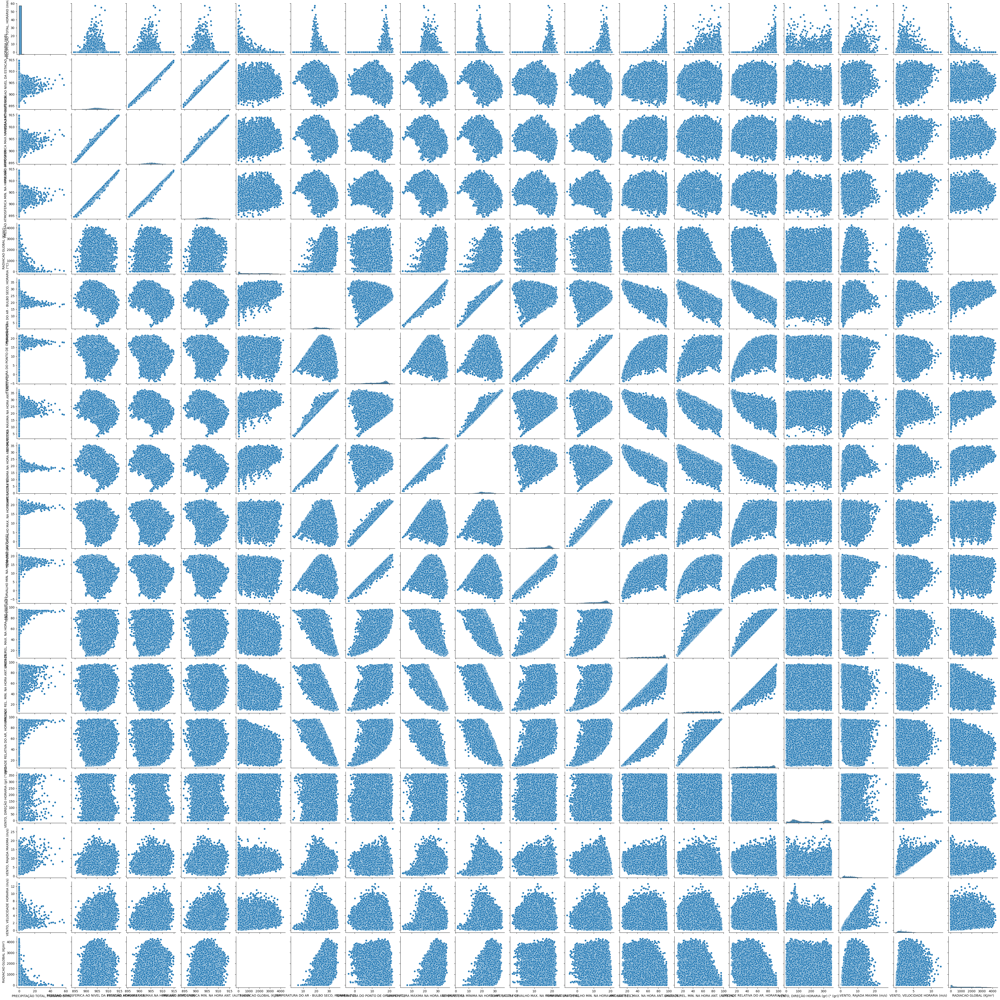

In [88]:
sns.pairplot(df_clean)
plt.show()

In [ ]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66818 entries, 0 to 66817
Data columns (total 22 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   Data                                                   48192 non-null  object 
 1   Hora UTC                                               48192 non-null  object 
 2   PRECIPITAÇÃO TOTAL, HORÁRIO (mm)                       66661 non-null  float64
 3   PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORARIA (mB)  66637 non-null  float64
 4   PRESSÃO ATMOSFERICA MAX.NA HORA ANT. (AUT) (mB)        66625 non-null  float64
 5   PRESSÃO ATMOSFERICA MIN. NA HORA ANT. (AUT) (mB)       66625 non-null  float64
 6   RADIACAO GLOBAL (Kj/m²)                                20028 non-null  float64
 7   TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)           66663 non-null  float64
 8   TEMPERATURA DO PONTO DE ORVALHO (°C)          

In [ ]:
df_clean.describe()

,"PRECIPITAÇÃO TOTAL, HORÁRIO (mm)","PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORARIA (mB)",PRESSÃO ATMOSFERICA MAX.NA HORA ANT. (AUT) (mB),PRESSÃO ATMOSFERICA MIN. NA HORA ANT. (AUT) (mB),RADIACAO GLOBAL (Kj/m²),"TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)",TEMPERATURA DO PONTO DE ORVALHO (°C),TEMPERATURA MÁXIMA NA HORA ANT. (AUT) (°C),TEMPERATURA MÍNIMA NA HORA ANT. (AUT) (°C),TEMPERATURA ORVALHO MAX. NA HORA ANT. (AUT) (°C),TEMPERATURA ORVALHO MIN. NA HORA ANT. (AUT) (°C),UMIDADE REL. MAX. NA HORA ANT. (AUT) (%),UMIDADE REL. MIN. NA HORA ANT. (AUT) (%),"UMIDADE RELATIVA DO AR, HORARIA (%)","VENTO, DIREÇÃO HORARIA (gr) (° (gr))","VENTO, RAJADA MAXIMA (m/s)","VENTO, VELOCIDADE HORARIA (m/s)",RADIACAO GLOBAL (KJ/m²)
count,66661.000000,66637.000000,66625.000000,66625.000000,20028.000000,66663.000000,66663.000000,66651.000000,66651.000000,66651.000000,66651.000000,66651.000000,66651.000000,66663.000000,66637.000000,66643.000000,66651.000000,23328.000000
mean,0.170766,905.018475,905.294409,904.766125,1459.623063,22.913718,13.906345,23.759882,21.993392,14.662974,13.174790,65.529249,57.998530,61.596268,172.936897,5.432317,2.388569,1476.152688
std,1.415764,2.543453,2.515314,2.551565,1090.750566,4.480052,4.595603,4.558360,4.445213,4.520443,4.664347,21.565060,22.090655,21.985785,114.181202,2.922848,1.597841,1112.827689
min,0.000000,894.500000,895.400000,894.500000,0.000000,2.300000,-3.900000,3.200000,1.400000,-2.400000,-6.000000,10.000000,8.000000,10.000000,1.000000,0.400000,0.000000,0.000000
25%,0.000000,903.300000,903.600000,903.000000,427.300000,19.700000,10.500000,20.300000,19.000000,11.300000,9.700000,49.000000,40.000000,44.000000,69.000000,2.900000,1.100000,410.200000
50%,0.000000,905.000000,905.200000,904.700000,1380.850000,22.500000,15.400000,23.500000,21.500000,16.200000,14.600000,69.000000,58.000000,63.000000,149.000000,5.100000,2.000000,1359.350000
75%,0.000000,906.700000,906.900000,906.500000,2416.625000,26.400000,17.700000,27.400000,25.300000,18.300000,17.100000,85.000000,77.000000,82.000000,300.000000,7.400000,3.300000,2454.175000
max,57.400000,914.700000,914.800000,914.500000,4244.500000,36.600000,21.900000,37.300000,35.700000,22.800000,20.900000,96.000000,96.000000,96.000000,360.000000,26.600000,12.700000,4293.200000


In [ ]:
df_clean

,Data,Hora UTC,"PRECIPITAÇÃO TOTAL, HORÁRIO (mm)","PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORARIA (mB)",PRESSÃO ATMOSFERICA MAX.NA HORA ANT. (AUT) (mB),PRESSÃO ATMOSFERICA MIN. NA HORA ANT. (AUT) (mB),RADIACAO GLOBAL (Kj/m²),"TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)",TEMPERATURA DO PONTO DE ORVALHO (°C),TEMPERATURA MÁXIMA NA HORA ANT. (AUT) (°C),...,TEMPERATURA ORVALHO MIN. NA HORA ANT. (AUT) (°C),UMIDADE REL. MAX. NA HORA ANT. (AUT) (%),UMIDADE REL. MIN. NA HORA ANT. (AUT) (%),"UMIDADE RELATIVA DO AR, HORARIA (%)","VENTO, DIREÇÃO HORARIA (gr) (° (gr))","VENTO, RAJADA MAXIMA (m/s)","VENTO, VELOCIDADE HORARIA (m/s)",RADIACAO GLOBAL (KJ/m²),DATA (YYYY-MM-DD),HORA (UTC)
0,2024/01/01,0000 UTC,0.0,903.1,903.2,902.7,NaN,22.7,18.1,23.4,...,18.1,80.0,73.0,75.0,310.0,2.9,1.6,NaN,NaN,NaN
1,2024/01/01,0100 UTC,0.0,904.2,904.3,903.1,NaN,22.6,18.3,22.9,...,18.1,78.0,75.0,77.0,340.0,2.5,1.1,NaN,NaN,NaN
2,2024/01/01,0200 UTC,0.0,904.7,904.8,904.2,NaN,21.3,18.6,22.6,...,17.3,87.0,77.0,84.0,352.0,2.2,0.9,NaN,NaN,NaN
3,2024/01/01,0300 UTC,0.0,904.7,905.0,904.7,NaN,20.1,18.2,21.5,...,17.2,89.0,83.0,89.0,55.0,1.5,0.8,NaN,NaN,NaN
4,2024/01/01,0400 UTC,0.0,903.9,904.7,903.9,NaN,20.6,18.4,21.3,...,18.2,90.0,85.0,87.0,324.0,1.7,0.9,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66813,NaN,NaN,0.0,902.9,903.9,902.9,NaN,26.6,17.9,27.4,...,16.8,64.0,55.0,59.0,128.0,7.6,3.0,1679.7,2014-12-31,18:00
66814,NaN,NaN,0.0,902.5,903.0,902.4,NaN,27.8,16.8,27.8,...,16.8,63.0,50.0,51.0,196.0,4.5,1.9,1078.2,2014-12-31,19:00
66815,NaN,NaN,0.2,902.4,903.0,902.4,NaN,21.4,18.0,28.7,...,14.5,81.0,48.0,81.0,191.0,13.2,2.2,724.6,2014-12-31,20:00
66816,NaN,NaN,0.0,902.8,902.8,902.4,NaN,21.7,18.0,22.2,...,17.6,83.0,76.0,79.0,348.0,4.0,1.1,111.8,2014-12-31,21:00


In [ ]:
df_clean

,Data,Hora UTC,"PRECIPITAÇÃO TOTAL, HORÁRIO (mm)","PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORARIA (mB)",PRESSÃO ATMOSFERICA MAX.NA HORA ANT. (AUT) (mB),PRESSÃO ATMOSFERICA MIN. NA HORA ANT. (AUT) (mB),RADIACAO GLOBAL (Kj/m²),"TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)",TEMPERATURA DO PONTO DE ORVALHO (°C),TEMPERATURA MÁXIMA NA HORA ANT. (AUT) (°C),...,TEMPERATURA ORVALHO MIN. NA HORA ANT. (AUT) (°C),UMIDADE REL. MAX. NA HORA ANT. (AUT) (%),UMIDADE REL. MIN. NA HORA ANT. (AUT) (%),"UMIDADE RELATIVA DO AR, HORARIA (%)","VENTO, DIREÇÃO HORARIA (gr) (° (gr))","VENTO, RAJADA MAXIMA (m/s)","VENTO, VELOCIDADE HORARIA (m/s)",RADIACAO GLOBAL (KJ/m²),DATA (YYYY-MM-DD),HORA (UTC)
0,2024/01/01,0000 UTC,0.0,903.1,903.2,902.7,NaN,22.7,18.1,23.4,...,18.1,80.0,73.0,75.0,310.0,2.9,1.6,NaN,NaN,NaN
1,2024/01/01,0100 UTC,0.0,904.2,904.3,903.1,NaN,22.6,18.3,22.9,...,18.1,78.0,75.0,77.0,340.0,2.5,1.1,NaN,NaN,NaN
2,2024/01/01,0200 UTC,0.0,904.7,904.8,904.2,NaN,21.3,18.6,22.6,...,17.3,87.0,77.0,84.0,352.0,2.2,0.9,NaN,NaN,NaN
3,2024/01/01,0300 UTC,0.0,904.7,905.0,904.7,NaN,20.1,18.2,21.5,...,17.2,89.0,83.0,89.0,55.0,1.5,0.8,NaN,NaN,NaN
4,2024/01/01,0400 UTC,0.0,903.9,904.7,903.9,NaN,20.6,18.4,21.3,...,18.2,90.0,85.0,87.0,324.0,1.7,0.9,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66813,NaN,NaN,0.0,902.9,903.9,902.9,NaN,26.6,17.9,27.4,...,16.8,64.0,55.0,59.0,128.0,7.6,3.0,1679.7,2014-12-31,18:00
66814,NaN,NaN,0.0,902.5,903.0,902.4,NaN,27.8,16.8,27.8,...,16.8,63.0,50.0,51.0,196.0,4.5,1.9,1078.2,2014-12-31,19:00
66815,NaN,NaN,0.2,902.4,903.0,902.4,NaN,21.4,18.0,28.7,...,14.5,81.0,48.0,81.0,191.0,13.2,2.2,724.6,2014-12-31,20:00
66816,NaN,NaN,0.0,902.8,902.8,902.4,NaN,21.7,18.0,22.2,...,17.6,83.0,76.0,79.0,348.0,4.0,1.1,111.8,2014-12-31,21:00


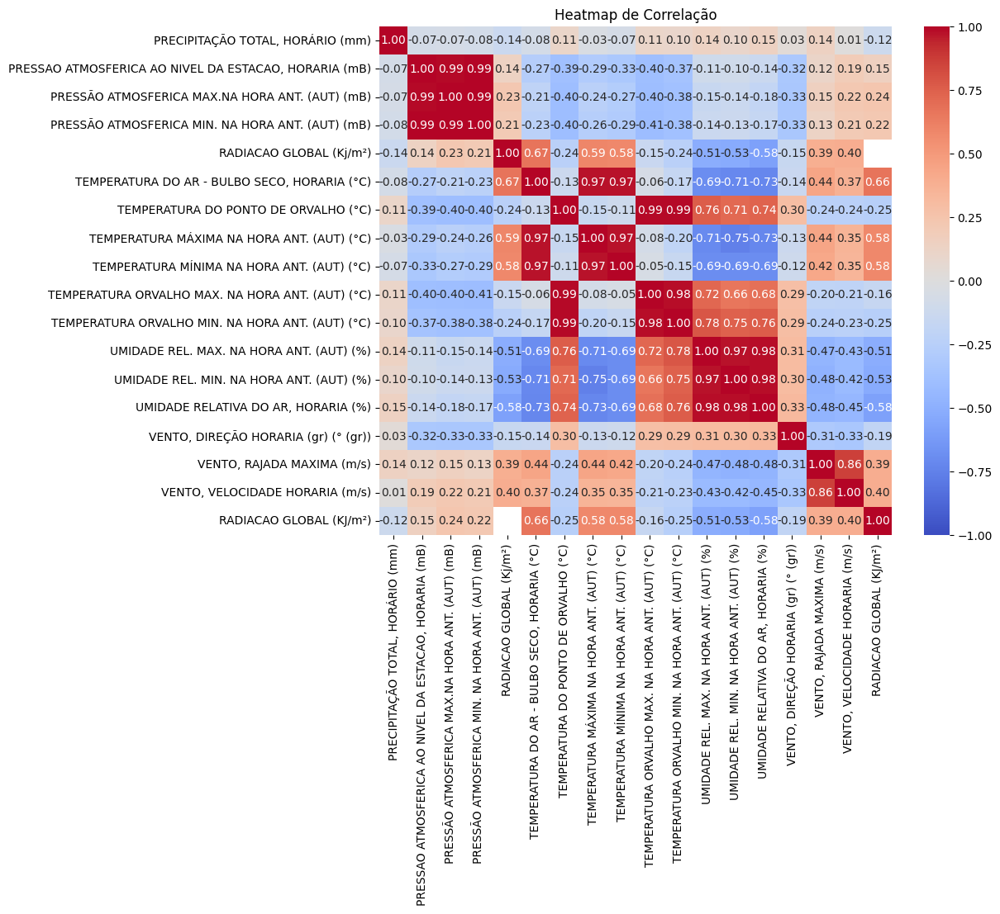

In [ ]:
# Calcula a matriz de correlação
df_numbers = df_clean.select_dtypes(include='number')
correlation_matrix = df_numbers.corr()

# Cria o heatmap da matriz de correlação
plt.figure(figsize=(10, 8))  # Ajusta o tamanho da figura
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)

# Exibe o gráfico
plt.title('Heatmap de Correlação')
plt.show()

In [ ]:
mean_abs_correlation = correlation_matrix.abs().median()
top_10 = mean_abs_correlation.nsmallest(10)
print("As 10 variáveis mais descorrelacionadas são:")
print(top_10)

As 10 variáveis mais descorrelacionadas são:
PRECIPITAÇÃO TOTAL, HORÁRIO (mm)                         0.099746
PRESSÃO ATMOSFERICA MAX.NA HORA ANT. (AUT) (mB)          0.241283
PRESSÃO ATMOSFERICA MIN. NA HORA ANT. (AUT) (mB)         0.246693
PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORARIA (mB)    0.280720
VENTO, DIREÇÃO HORARIA (gr) (° (gr))                     0.300642
TEMPERATURA ORVALHO MIN. NA HORA ANT. (AUT) (°C)         0.328745
TEMPERATURA ORVALHO MAX. NA HORA ANT. (AUT) (°C)         0.341351
TEMPERATURA DO PONTO DE ORVALHO (°C)                     0.342388
VENTO, VELOCIDADE HORARIA (m/s)                          0.349434
TEMPERATURA MÍNIMA NA HORA ANT. (AUT) (°C)               0.384040
dtype: float64


In [ ]:
df.columns

cols_select = ['PRECIPITAÇÃO TOTAL, HORÁRIO (mm)', 'PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORARIA (mB)',
               'VENTO, DIREÇÃO HORARIA (gr) (° (gr))', 'RADIACAO GLOBAL (KJ/m²)', 'TEMPERATURA ORVALHO MAX. NA HORA ANT. (AUT) (°C)']

df_select = df_clean[cols_select]

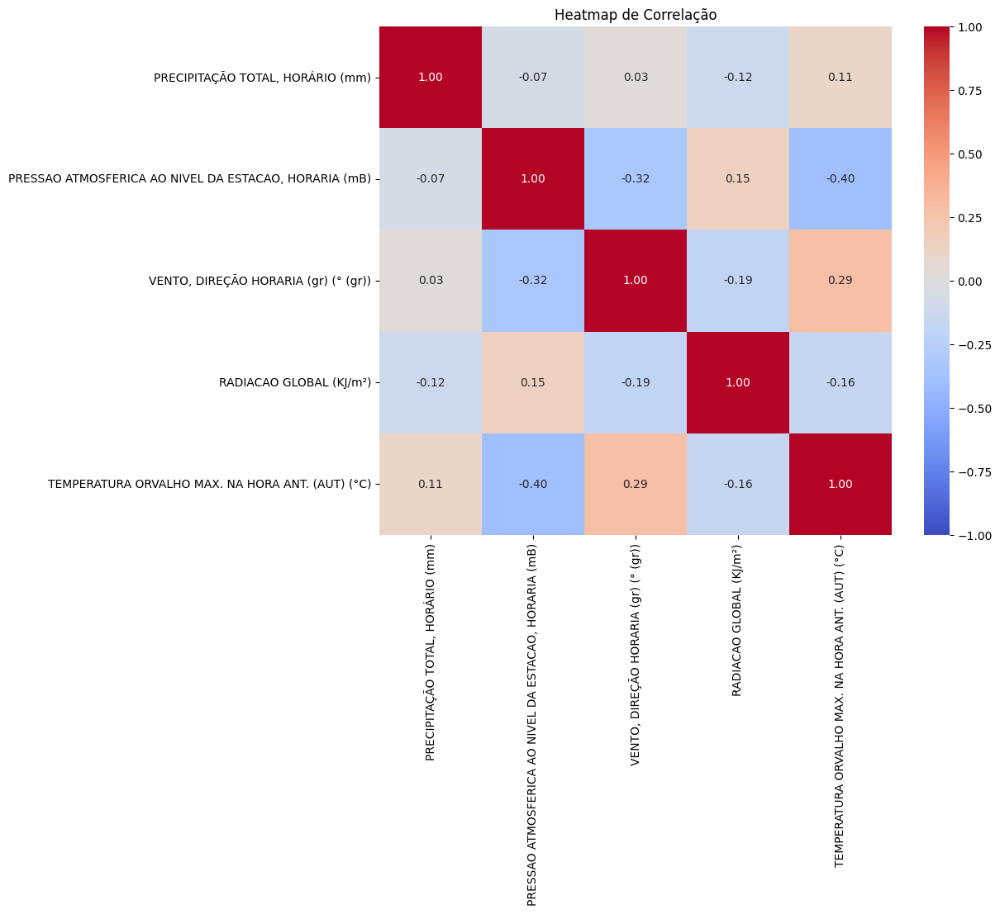

In [ ]:
correlation_matrix = df_select.corr()
plt.figure(figsize=(10, 8))  # Ajusta o tamanho da figura
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)
plt.title('Heatmap de Correlação')
plt.show()

# Trabalhando com os dados de desligamentos das LTs

In [76]:
df_burn = pd.read_csv("/content/drive/Shareddrives/Inspectral - Queimadas/PLANILHAS DESLIGAMENTOS - DADOS/Planilhas filtradas/furnas_queimada.csv",
                      sep=';')

In [77]:
df_burn = df_burn[
    (df_burn["Agente Proprietário do Equipamento Desligado"] == "FURNAS") &
    (df_burn["Terminal de Referência para localização de falta"] == "S.DA MESA")
]

In [78]:
df_clean['DATA_HORA'] = df_clean['DATA (YYYY-MM-DD)'] + ' ' + df_clean['HORA (UTC)']
copy_df = df_clean.copy()
df_clean['DATA_HORA'] = pd.to_datetime(df_clean['DATA_HORA'], format='%Y/%m/%d %H%M UTC', errors='coerce')
df_clean['DATA_HORA'] = df_clean['DATA_HORA'].fillna(pd.to_datetime(copy_df['DATA_HORA'], format='%Y-%m-%d %H:%M', errors='coerce'))

In [ ]:
df_clean['DATA_HORA']

In [ ]:
df_clean

In [79]:
df_burn["Data do Desligamento Efetivo"] = pd.to_datetime(df_burn["Data do Desligamento Efetivo"], format="%d/%m/%Y %H:%M")

In [80]:
import numpy as np

# Função para encontrar a linha de df_clean mais próxima para cada linha de df_burn
def find_closest(row, df_clean):
    # Calcula a diferença em relação a cada data de df_clean
    time_diff = abs(df_clean['DATA_HORA'] - row['Data do Desligamento Efetivo'])

    # Filtra as diferenças menores ou iguais a 1 dia (24 horas)
    close_values = time_diff[time_diff <= pd.Timedelta(days=1)]

    # Se houver correspondência, retorna o índice da menor diferença, senão retorna NaN
    if not close_values.empty:
        return df_clean.loc[close_values.idxmin()].name
    else:
        return np.nan

# Aplica a função a cada linha do DataFrame df_burn
df_burn['IDX_MAIS_PROXIMA'] = df_burn.apply(find_closest, axis=1, df_clean=df_clean)
df_burn = df_burn.merge(df_clean, left_on='IDX_MAIS_PROXIMA', right_index=True) #, suffixes=('_burn', '_clean'))

# Verifica o resultado
# print(df_burn.head())

In [85]:
used_indices = df_burn['IDX_MAIS_PROXIMA'].dropna().unique()
df_clean_not_used = df_clean.loc[~df_clean.index.isin(used_indices)]
df_clean_not_used_sample = df_clean_not_used.sample(n=min(len(df_burn), len(df_clean_not_used)), random_state=42)

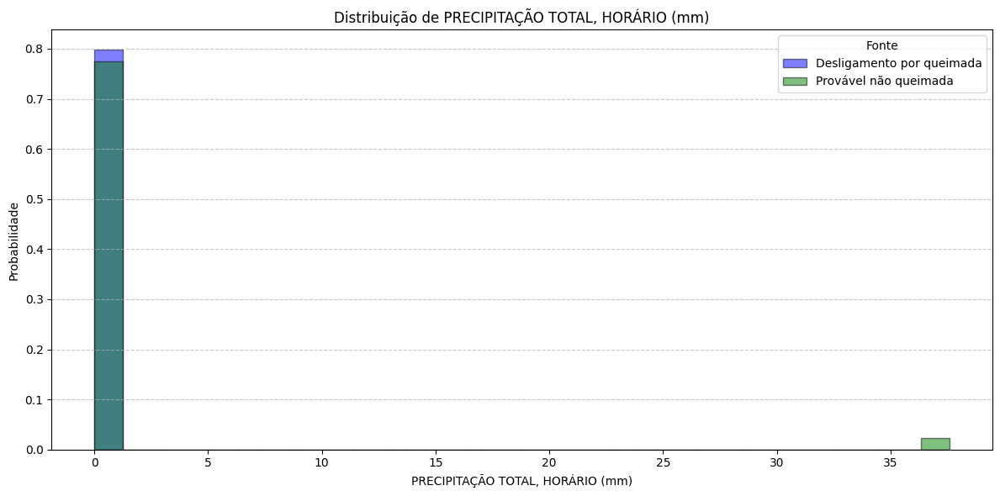

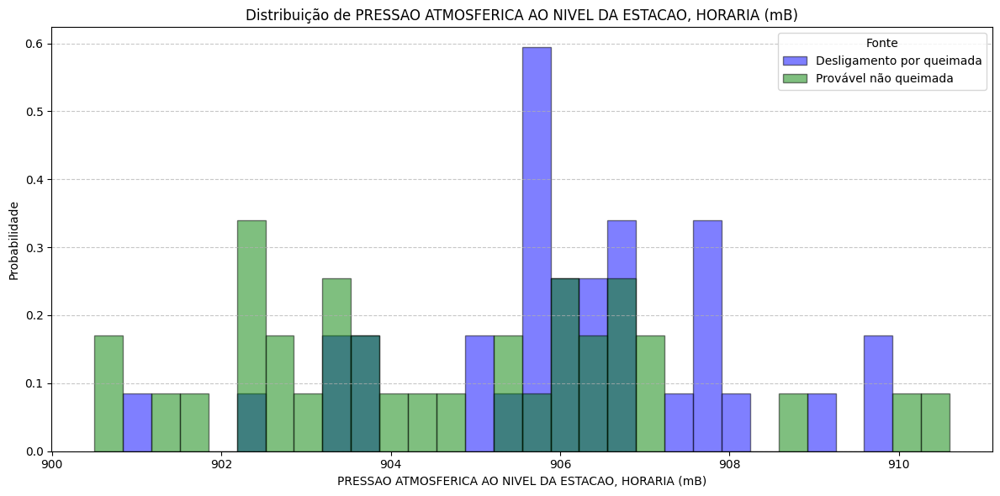

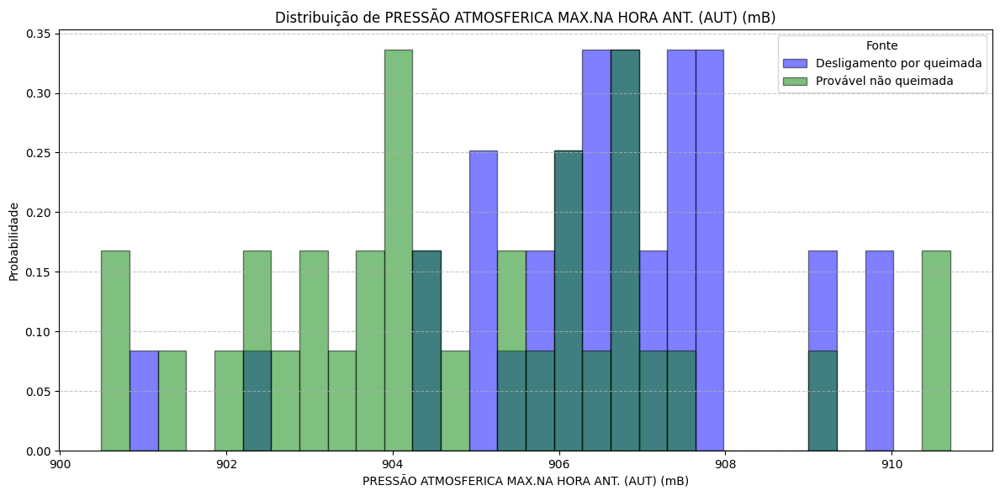

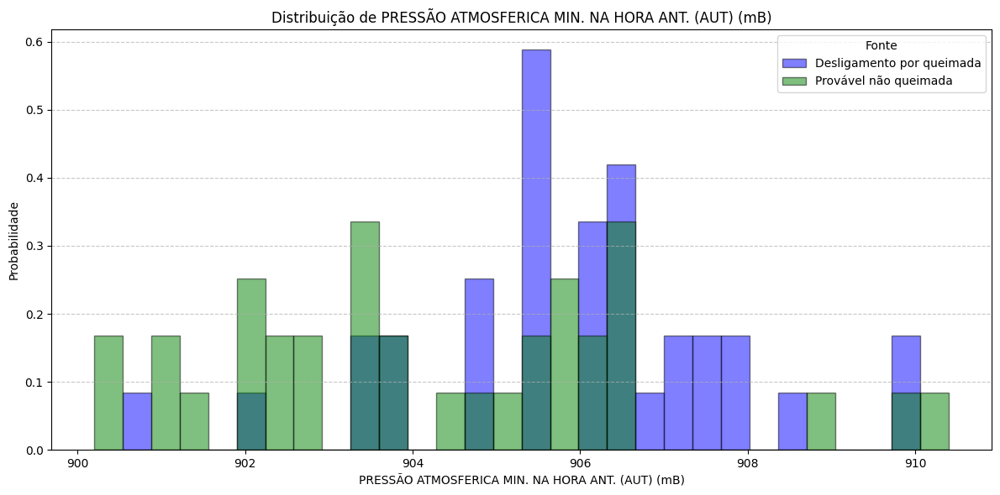

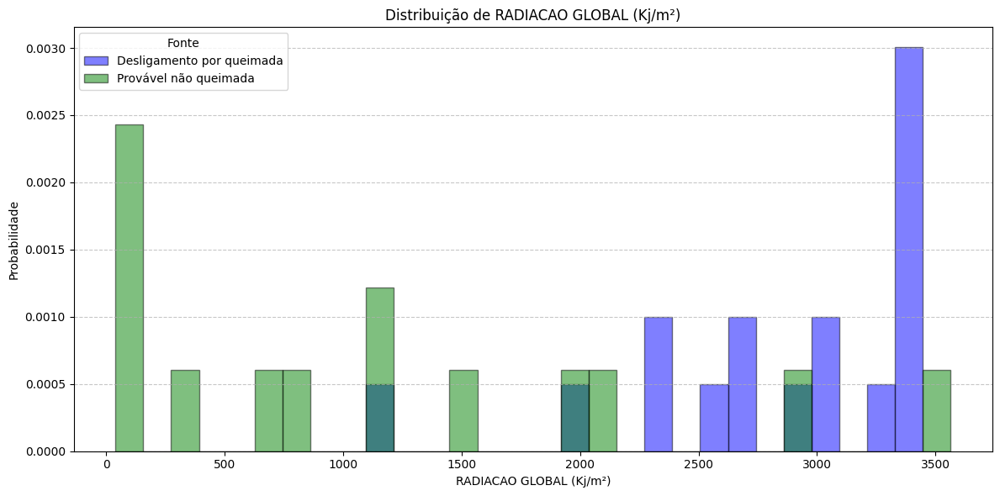

...

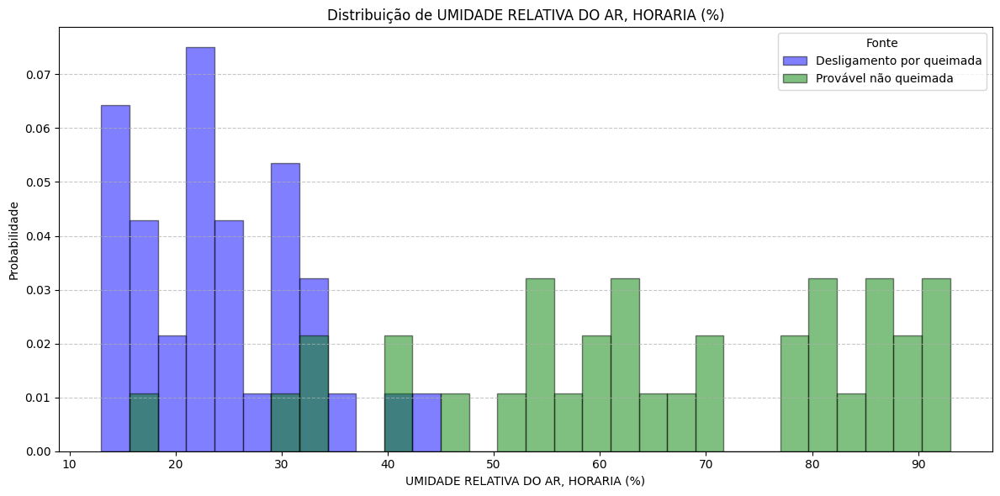

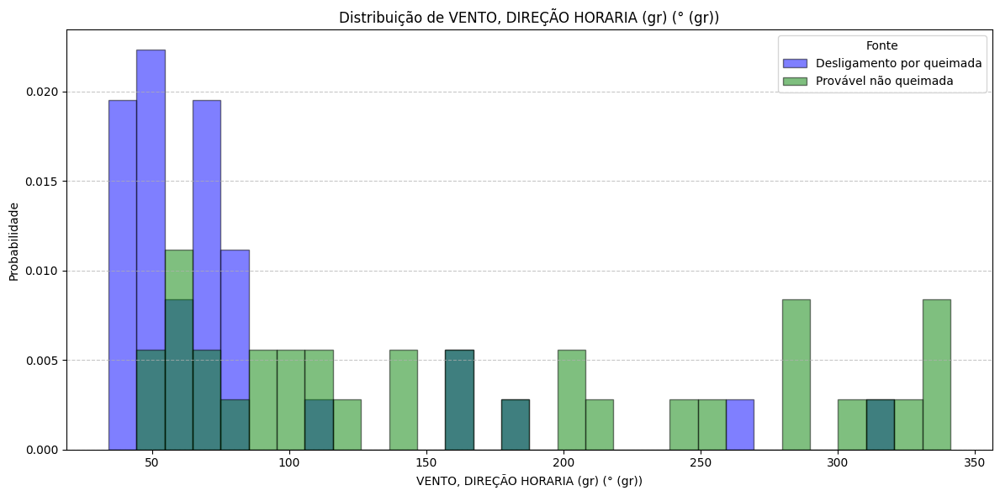

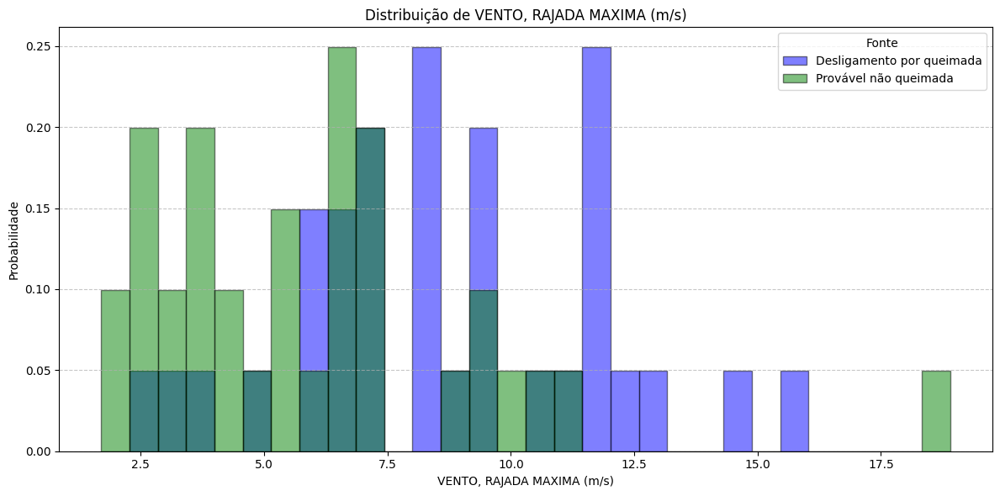

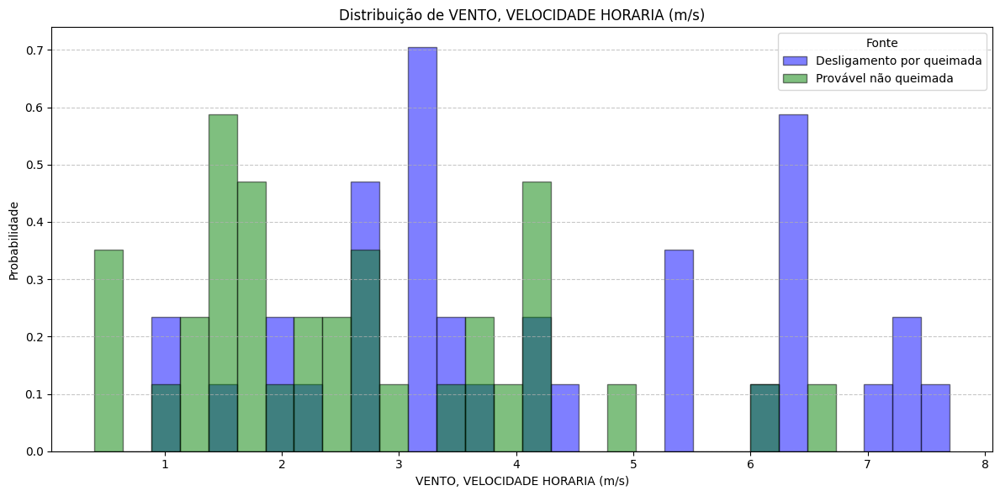

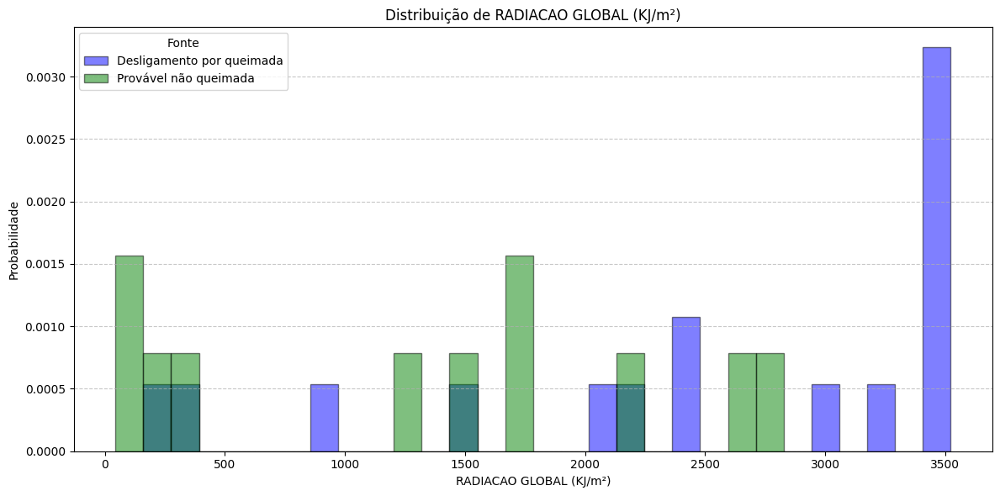

In [86]:
df_burn_renamed = df_burn.copy()
df_burn_renamed.columns = df_burn_renamed.columns.str.rstrip('_y')

columns_to_exclude = ['DATA_HORA', 'DATA (YYYY-MM-DD)', 'HORA (UTC)']
common_columns = df_burn_renamed.columns.intersection(df_clean_not_used_sample.columns)
common_columns = common_columns.drop(columns_to_exclude, errors='ignore')
# df_combined = pd.concat([df_burn_renamed[common_columns], df_clean_not_used_sample[common_columns]], axis=0)

for col in common_columns:
    plt.figure(figsize=(12, 6))

    # Definir os limites dos bins com base nos dados combinados
    data_combined = pd.concat([df_burn_renamed[col].dropna(), df_clean_not_used_sample[col].dropna()])
    bin_edges = np.histogram_bin_edges(data_combined, bins=30)

    # Plotar o histograma para df_burn com borda preta e bins alinhados
    plt.hist(df_burn_renamed[col].dropna(), bins=bin_edges, density=True, alpha=0.5, color='blue', edgecolor='black', label='Desligamento por queimada')

    # Plotar o histograma para df_clean_not_used_sample com borda preta e bins alinhados
    plt.hist(df_clean_not_used_sample[col].dropna(), bins=bin_edges, density=True, alpha=0.5, color='green', edgecolor='black', label='Provável não queimada')

    # Adicionar título, labels e legenda
    plt.title(f'Distribuição de {col}')
    plt.xlabel(col)
    plt.ylabel('Probabilidade')
    plt.legend(title='Fonte')

    # Adicionar grid no eixo y
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

# Teste da formatação dos dados

In [ ]:
df = pd.read_csv('/content/drive/Shareddrives/Inspectral - Queimadas/Download_estações_INMET/25_estações/2019/INMET_CO_DF_A046_GAMA (PONTE ALTA)_01-01-2019_A_31-12-2019.CSV',
                 header=8, sep=';', encoding='latin-1', decimal=',')

df = df.drop(columns=["Unnamed: 19"])

df['DATA_HORA'] = df['Data'] + ' ' + df['Hora UTC']
df['DATA_HORA'] = pd.to_datetime(df['DATA_HORA'], format='%Y/%m/%d %H%M UTC')

In [ ]:
df

,Data,Hora UTC,"PRECIPITAÇÃO TOTAL, HORÁRIO (mm)","PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORARIA (mB)",PRESSÃO ATMOSFERICA MAX.NA HORA ANT. (AUT) (mB),PRESSÃO ATMOSFERICA MIN. NA HORA ANT. (AUT) (mB),RADIACAO GLOBAL (KJ/m²),"TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)",TEMPERATURA DO PONTO DE ORVALHO (°C),TEMPERATURA MÁXIMA NA HORA ANT. (AUT) (°C),TEMPERATURA MÍNIMA NA HORA ANT. (AUT) (°C),TEMPERATURA ORVALHO MAX. NA HORA ANT. (AUT) (°C),TEMPERATURA ORVALHO MIN. NA HORA ANT. (AUT) (°C),UMIDADE REL. MAX. NA HORA ANT. (AUT) (%),UMIDADE REL. MIN. NA HORA ANT. (AUT) (%),"UMIDADE RELATIVA DO AR, HORARIA (%)","VENTO, DIREÇÃO HORARIA (gr) (° (gr))","VENTO, RAJADA MAXIMA (m/s)","VENTO, VELOCIDADE HORARIA (m/s)",DATA_HORA
0,2019/01/01,0000 UTC,0.4,904.9,904.9,904.0,NaN,20.1,17.6,20.9,20.1,17.7,17.2,86.0,80.0,86.0,292.0,6.7,1.2,2019-01-01 00:00:00
1,2019/01/01,0100 UTC,0.0,905.4,905.4,904.9,NaN,19.6,18.0,20.3,19.4,18.0,17.6,91.0,85.0,91.0,48.0,2.7,1.9,2019-01-01 01:00:00
2,2019/01/01,0200 UTC,0.6,905.7,905.8,905.4,NaN,20.2,18.4,20.2,19.6,18.4,18.0,91.0,89.0,89.0,318.0,2.7,0.9,2019-01-01 02:00:00
3,2019/01/01,0300 UTC,0.0,904.9,905.8,904.9,NaN,19.8,17.7,20.7,19.8,18.7,17.6,91.0,84.0,88.0,351.0,3.4,1.0,2019-01-01 03:00:00
4,2019/01/01,0400 UTC,0.0,904.4,904.9,904.4,NaN,19.4,17.0,19.9,19.4,17.9,16.9,90.0,86.0,86.0,330.0,2.6,1.4,2019-01-01 04:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,2019/12/31,1900 UTC,0.4,901.9,902.4,901.7,49.6,20.2,18.0,21.6,20.2,18.4,17.6,87.0,79.0,87.0,214.0,4.7,1.0,2019-12-31 19:00:00
8756,2019/12/31,2000 UTC,1.0,901.2,901.9,901.0,279.7,20.6,18.2,20.6,20.1,18.4,17.9,89.0,86.0,86.0,301.0,4.8,1.7,2019-12-31 20:00:00
8757,2019/12/31,2100 UTC,0.2,901.2,901.3,901.0,413.8,20.9,17.8,21.1,20.6,18.4,17.4,86.0,80.0,83.0,347.0,3.4,1.0,2019-12-31 21:00:00
8758,2019/12/31,2200 UTC,0.0,900.9,901.2,900.8,94.2,20.0,17.9,20.9,20.0,17.9,17.3,88.0,80.0,88.0,323.0,1.9,1.4,2019-12-31 22:00:00
